In [1]:
import pandas as pd
filePath = r"C:\Users\MatanLevy\Desktop\MBA\Third_year\Machine_Learning\Final_Project\cleanHistoricalData.csv"
df = pd.read_csv(filePath)
df.head()

,Unnamed: 0,Date time,Minimum Temperature,Maximum Temperature,Temperature,Dew Point,Relative Humidity,Heat Index,Wind Speed,Wind Gust,Wind Direction,Wind Chill,Precipitation,Snow Depth,Visibility,Cloud Cover,Sea Level Pressure,Weather Type,Conditions
0,0,02/01/2023 00:00:00,50.9,50.9,50.9,49.1,93.53,NaN,7.0,NaN,117.0,NaN,0.0,NaN,4.8,89.1,1011.0,Thunderstorm,Overcast
1,1,02/01/2023 01:00:00,44.0,44.0,44.0,39.5,84.07,NaN,13.0,NaN,243.0,37.6,0.0,NaN,5.6,86.8,1010.8,Thunderstorm,Overcast
2,2,02/01/2023 02:00:00,44.7,44.7,44.7,39.9,82.97,NaN,10.1,NaN,238.0,39.5,0.0,NaN,6.1,80.8,1010.3,"Mist, Rain, Thunderstorm",Overcast
3,3,02/01/2023 03:00:00,44.7,44.7,44.7,39.9,82.95,NaN,14.3,NaN,242.0,38.1,0.0,NaN,5.9,78.1,1009.9,"Thunderstorm, Light Rain",Overcast
4,4,02/01/2023 04:00:00,44.7,44.7,44.7,39.9,82.97,NaN,9.8,NaN,243.0,39.6,0.0,NaN,5.5,85.7,1009.8,"Rain, Thunderstorm",Overcast


In [2]:
df.columns

Index(['Unnamed: 0', 'Date time', 'Minimum Temperature', 'Maximum Temperature',
       'Temperature', 'Dew Point', 'Relative Humidity', 'Heat Index',
       'Wind Speed', 'Wind Gust', 'Wind Direction', 'Wind Chill',
       'Precipitation', 'Snow Depth', 'Visibility', 'Cloud Cover',
       'Sea Level Pressure', 'Weather Type', 'Conditions'],
      dtype='object')

In [3]:
df['temp_c'] = (df['Temperature'] - 32) * 5/9 # from Fernhight to Celcius
df['Snow Depth (cm)'] = df['Snow Depth'] * 2.54 # from Inches to cm

In [4]:
# Calculate basic statistics for 'temp_c' column
print('Temperature in Celsius:')
print('Mean:', df['temp_c'].mean())
print('Median:', df['temp_c'].median())
print('Standard Deviation:', df['temp_c'].std())
print('Minimum:', df['temp_c'].min())
print('Maximum:', df['temp_c'].max())

# Calculate basic statistics for 'Precipitation' column
print('\nPrecipitation:')
print('Mean:', df['Precipitation'].mean())
print('Median:', df['Precipitation'].median())
print('Standard Deviation:', df['Precipitation'].std())
print('Minimum:', df['Precipitation'].min())
print('Maximum:', df['Precipitation'].max())

# Calculate basic statistics for 'Relative Humidity' column
print('\nRelative Humidity:')
print('Mean:', df['Relative Humidity'].mean())
print('Median:', df['Relative Humidity'].median())
print('Standard Deviation:', df['Relative Humidity'].std())
print('Minimum:', df['Relative Humidity'].min())
print('Maximum:', df['Relative Humidity'].max())

# Calculate high and low temperature ranges for 'temp_c' column
temp_c_high = df['temp_c'].max()
temp_c_low = df['temp_c'].min()
print('\nTemperature in Celsius:')
print('High:', temp_c_high)
print('Low:', temp_c_low)

# Calculate high and low precipitation ranges for 'Precipitation' column
precip_high = df['Precipitation'].max()
precip_low = df['Precipitation'].min()
print('\nPrecipitation:')
print('High:', precip_high)
print('Low:', precip_low)

# Calculate high and low relative humidity ranges for 'Relative Humidity' column
rh_high = df['Relative Humidity'].max()
rh_low = df['Relative Humidity'].min()
print('\nRelative Humidity:')
print('High:', rh_high)
print('Low:', rh_low)


Temperature in Celsius:
Mean: 18.31257307935286
Median: 18.388888888888886
Standard Deviation: 7.2641141846047965
Minimum: -6.222222222222222
Maximum: 43.166666666666664

Precipitation:
Mean: 0.0015375365409007686
Median: 0.0
Standard Deviation: 0.034790803018549483
Minimum: 0.0
Maximum: 10.04

Relative Humidity:
Mean: 62.02928842373108
Median: 63.02
Standard Deviation: 20.894939949950583
Minimum: 2.38
Maximum: 100.0

Temperature in Celsius:
High: 43.166666666666664
Low: -6.222222222222222

Precipitation:
High: 10.04
Low: 0.0

Relative Humidity:
High: 100.0
Low: 2.38


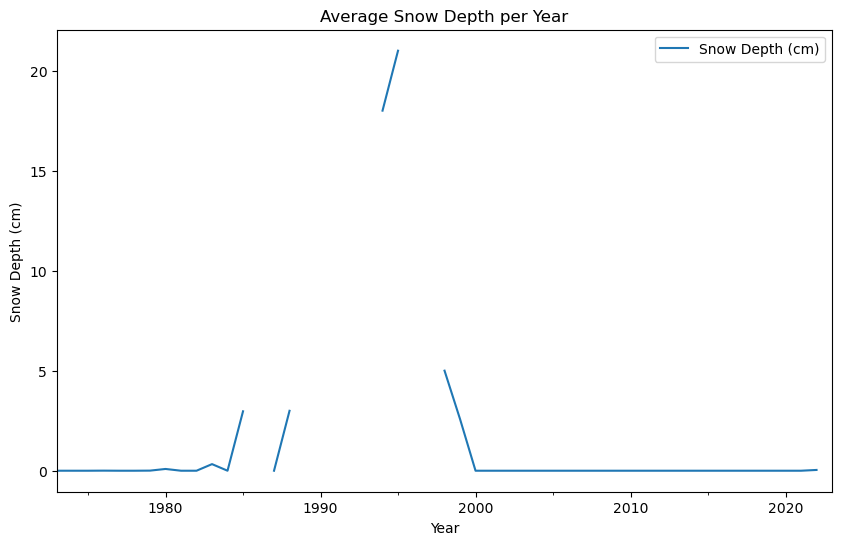

In [5]:
import matplotlib.pyplot as plt

# Convert date string to datetime object and set as index
df['Date time'] = pd.to_datetime(df['Date time'])
df.set_index('Date time', inplace=True)

# Create a new DataFrame with only the Snow Depth column
snow_df = df[['Snow Depth (cm)']]

# Resample the data by year and calculate the mean Snow Depth for each year
snow_df = snow_df.resample('Y').mean()

# Plot the data as a line graph
snow_df.plot(kind='line', y='Snow Depth (cm)', figsize=(10, 6))
plt.title('Average Snow Depth per Year')
plt.xlabel('Year')
plt.ylabel('Snow Depth (cm)')
plt.show()


We can see few cold extreme snowy events lasting for several observations (keeping in mind each observation is 1 hr period. Between 1995 to 2000 we had several over 20 cm of snow observation. Remaining years trend remained the same (this does not include the 2013 momentary spike

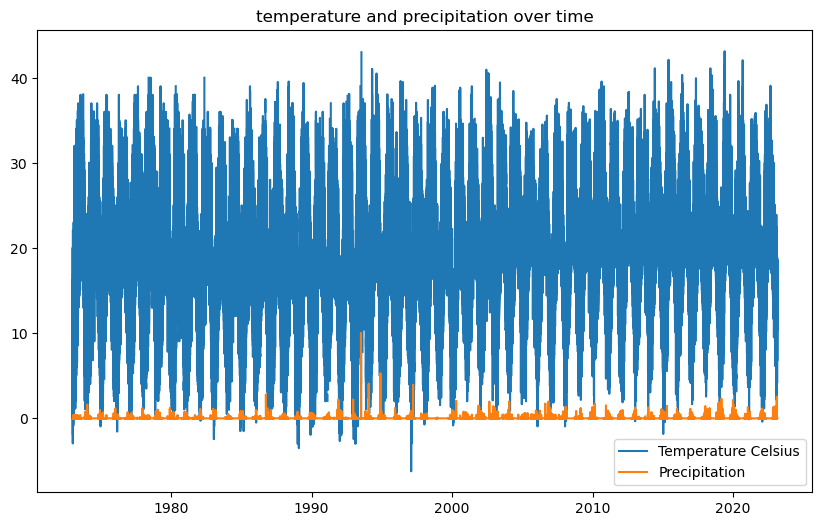

In [6]:
#first we reset back the index
df.reset_index(inplace=True)

# Convert the 'Date time' column to a datetime object
df['Date time'] = pd.to_datetime(df['Date time'])

# Plot the temperature and precipitation over time
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(df['Date time'], df['temp_c'], label='Temperature Celsius')
ax.plot(df['Date time'], df['Precipitation'], label='Precipitation')
plt.title('temperature and precipitation over time')
ax.legend()
plt.show()


Visualisation of Tempature and Precipitation over time.
1) Tempature: We can single out few extreme cold events - below 0°C Tempature, as oppose to numeous heatwaves - corssing the 35°C and over 40°C degrees.


2) Precipitation: Relativley steady and due to long period of exmination, difficult to see spikes and lows. We can see around 1992-1995 an anomoly with over 10mm of precipitation for several hourly observations.

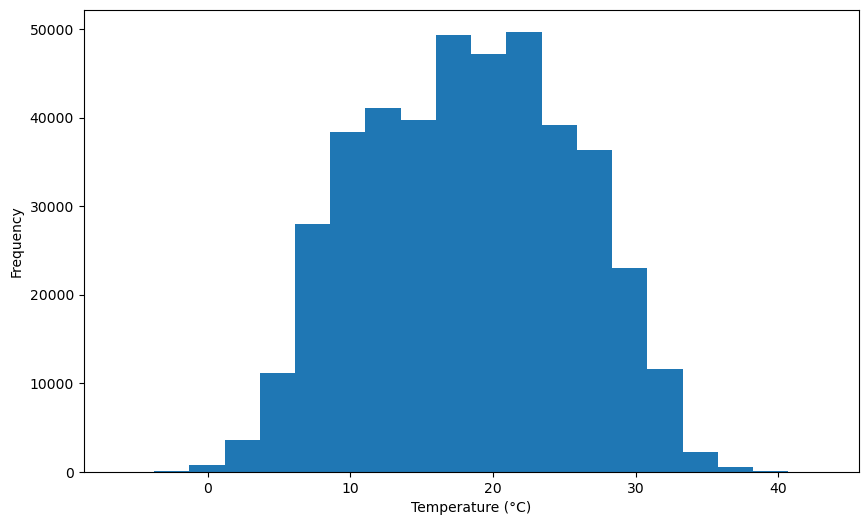

In [7]:
# Plot a histogram of temperature distribution
fig, ax = plt.subplots(figsize=(10,6))
ax.hist(df['temp_c'], bins=20)
ax.set_xlabel('Temperature (°C)')
ax.set_ylabel('Frequency')
plt.show()


When evalutaing the frequency of tempature over this period we can notice it is normally distributed with the calculated mean above of 18.3°C.

Now we will try to gain additional insights from analyzing the statistics of each month in the selected period:

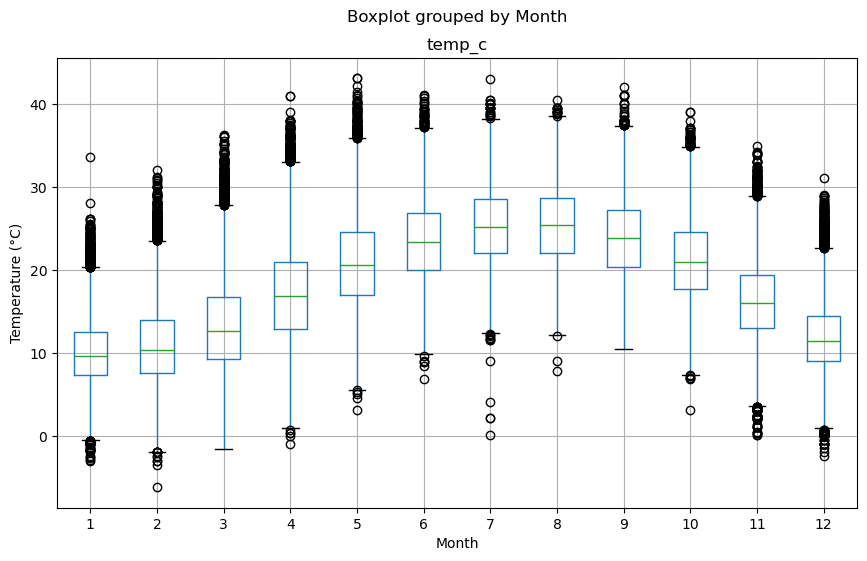

In [8]:
# Create a new column for the month
df['Month'] = df['Date time'].dt.month

# Plot a box plot of temperature by month
fig, ax = plt.subplots(figsize=(10,6))
df.boxplot(column='temp_c', by='Month', ax=ax)
ax.set_xlabel('Month')
ax.set_ylabel('Temperature (°C)')
plt.show()


In [9]:
summary_stats = df.groupby('Month')['temp_c'].agg(['min', 'max', 'median', 'mean', 'std'])
print(summary_stats)

             min        max     median       mean       std
Month                                                      
1      -3.000000  33.666667   9.666667  10.032592  4.052536
2      -6.222222  32.055556  10.388889  10.900535  4.674067
3      -1.555556  36.277778  12.611111  13.247271  5.328924
4      -0.944444  41.055556  16.833333  17.189826  5.725619
5       3.055556  43.166667  20.611111  20.874073  5.452204
6       6.833333  41.166667  23.333333  23.406592  4.637796
7       0.055556  43.055556  25.166667  25.222296  4.265588
8       7.833333  40.555556  25.388889  25.347455  4.247852
9      10.444444  42.111111  23.833333  23.919593  4.371365
10      3.055556  39.111111  20.944444  21.191273  4.637387
11      0.055556  34.944444  16.000000  16.253339  4.737043
12     -2.444444  31.055556  11.444444  11.858524  4.197251


This Graph present per month a five-number summary of the data, which consists of the minimum value, the first quartile, the median, the third quartile, and the maximum value. We can clearly see the diffrences between months and detailed information for statistical analysis. In the box of each month the smallest and largest observations within 1.5 times the interquartile range (IQR) of the data. Example of month analysis (graph and statistics): Feruary (02) - Minimum Observation - (-6.2°C) followed by addiitional observation up to first quantaile line - just below 0°C. The boxplot represting the second quantile limit with 50% of observation maximum. green line represent media value - 10.4°C. The "Whiskers" include the bottom and top edges. they include the maximumm distances of largest and smallest observations within 1.5 times the IQR. Crossing the the 3rd quantile range marked by an edge of the next horizontal line. lastly all highest observation are above this line ending with the maimum tempature of 32°C.

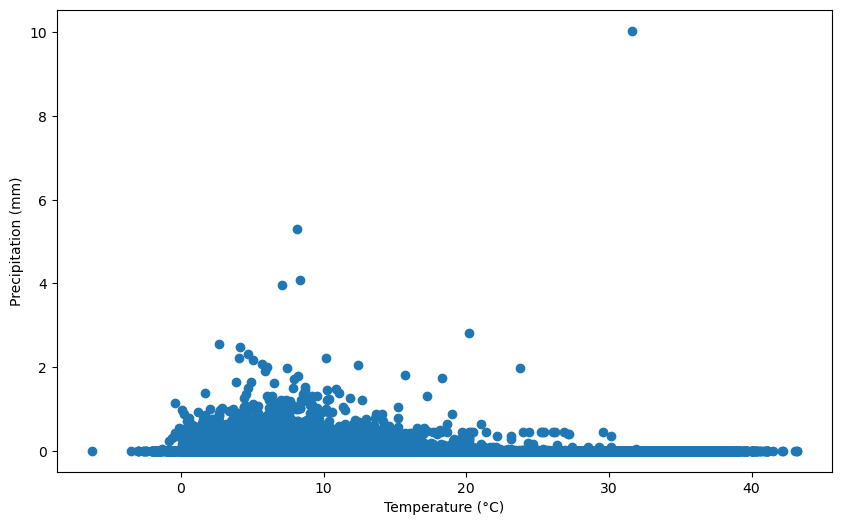

In [10]:
# Plot a scatter plot of temperature vs precipitation
fig, ax = plt.subplots(figsize=(10,6))
ax.scatter(df['temp_c'], df['Precipitation'])
ax.set_xlabel('Temperature (°C)')
ax.set_ylabel('Precipitation (mm)')
plt.show()


We do not see any clear correlation between Tempature to Precipitation (similiar to tropical weather types).

In [11]:
df.columns

Index(['Date time', 'Unnamed: 0', 'Minimum Temperature', 'Maximum Temperature',
       'Temperature', 'Dew Point', 'Relative Humidity', 'Heat Index',
       'Wind Speed', 'Wind Gust', 'Wind Direction', 'Wind Chill',
       'Precipitation', 'Snow Depth', 'Visibility', 'Cloud Cover',
       'Sea Level Pressure', 'Weather Type', 'Conditions', 'temp_c',
       'Snow Depth (cm)', 'Month'],
      dtype='object')

In [12]:
import seaborn as sns

def plot_variable_correlations(df):
    # Select the columns to loop over
    columns_to_check = ['Minimum Temperature', 'Maximum Temperature',
                        'Dew Point', 'Relative Humidity', 'Heat Index',
                        'Wind Speed', 'Wind Gust', 'Wind Direction', 'Wind Chill',
                        'Precipitation', 'Snow Depth', 'Visibility', 'Cloud Cover',
                        'Sea Level Pressure']
    
    # Create an empty list to store correlation results
    corr_results = []
    
    # Loop over the columns and calculate their correlations with each other
    for i in range(len(columns_to_check)):
        for j in range(i+1, len(columns_to_check)):
            col1 = columns_to_check[i]
            col2 = columns_to_check[j]
            
            # Calculate the correlation coefficient and append it to the list
            corr_coef = df[col1].corr(df[col2])
            corr_results.append((col1, col2, corr_coef))
    
    # Sort the correlation results by coefficient in descending order
    corr_results.sort(key=lambda x: x[2], reverse=True)
    
    # Plot the scatterplots in descending order of correlation coefficient
    for result in corr_results:
        col1 = result[0]
        col2 = result[1]
        fig, ax = plt.subplots(figsize=(10, 6))
        sns.scatterplot(x=col1, y=col2, data=df, ax=ax)
        ax.set_title(f'Correlation between {col1} and {col2}: {result[2]}')
        plt.show()


Here we are trying to examine the connection between all features and searching for correlation between each two individual variables/features.

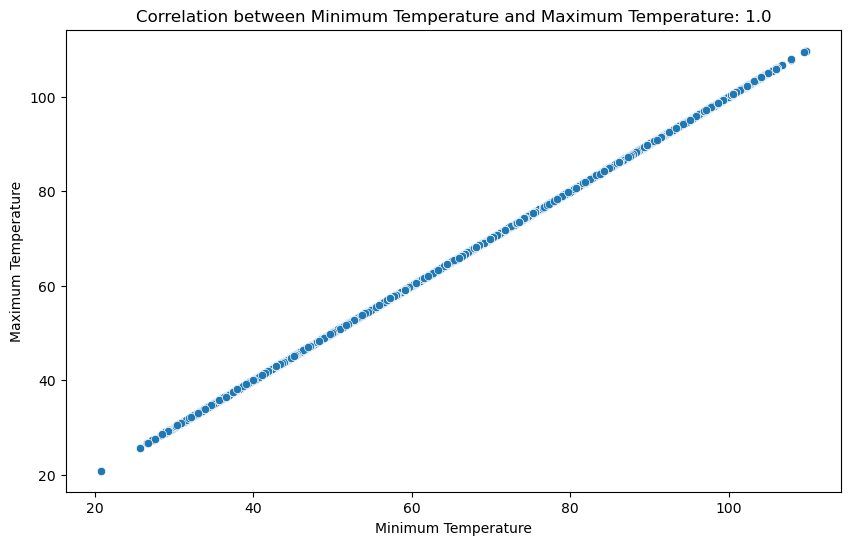

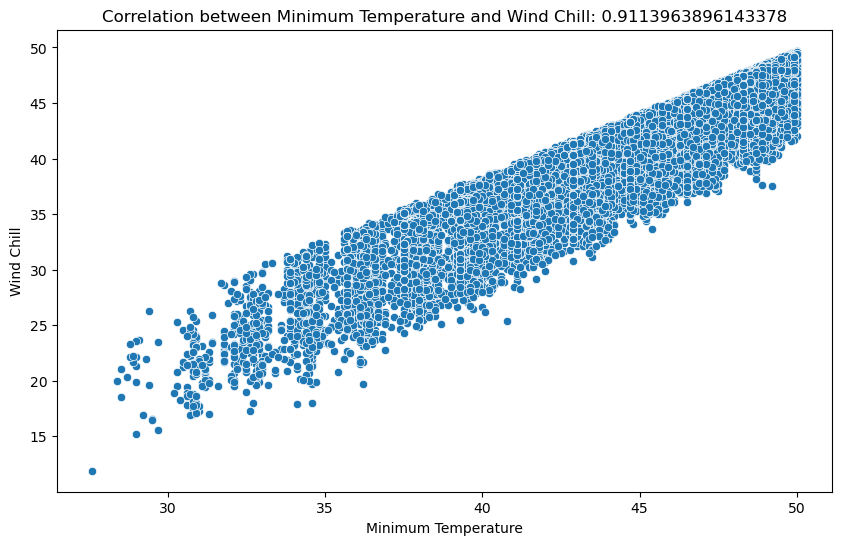

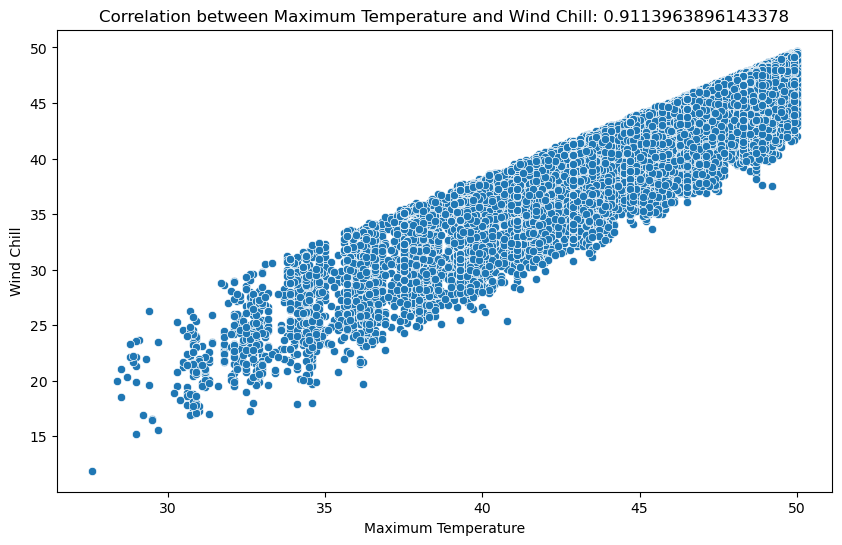

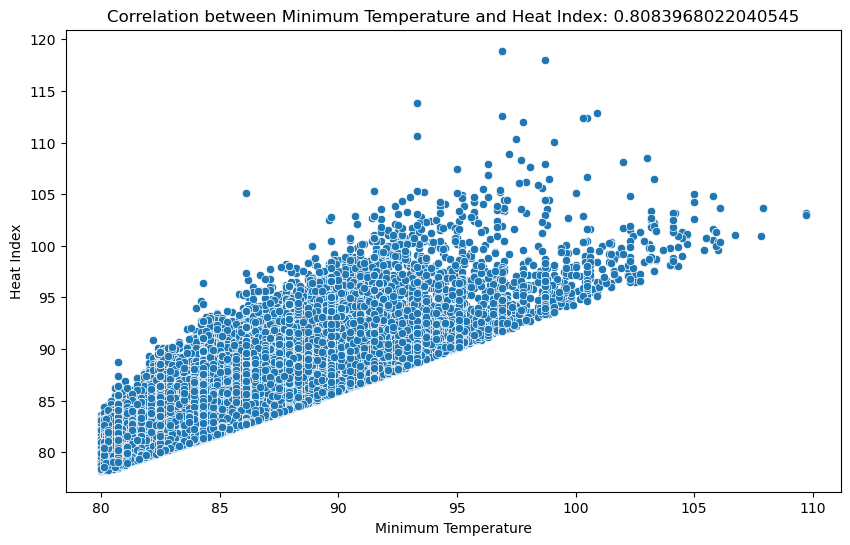

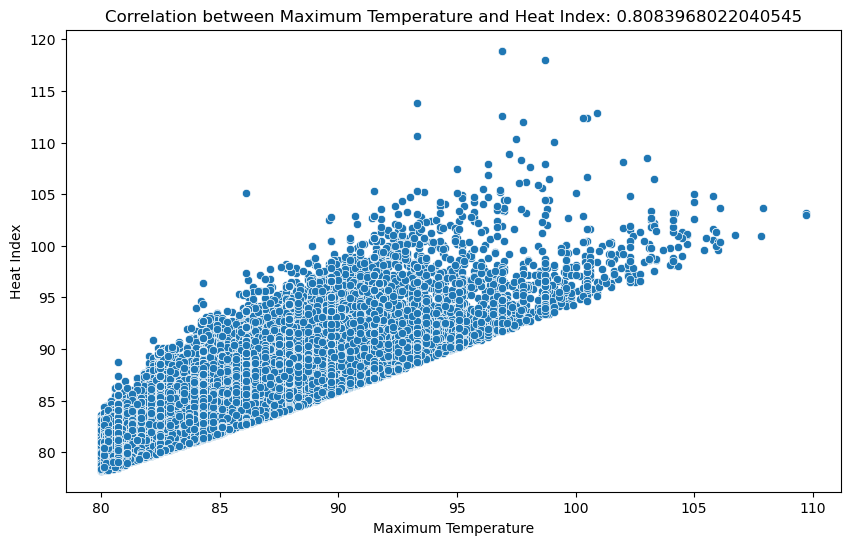

...

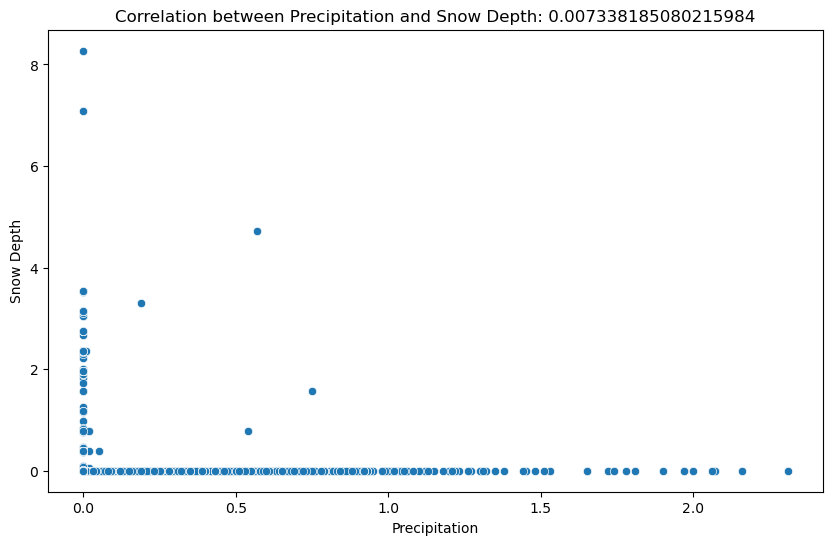

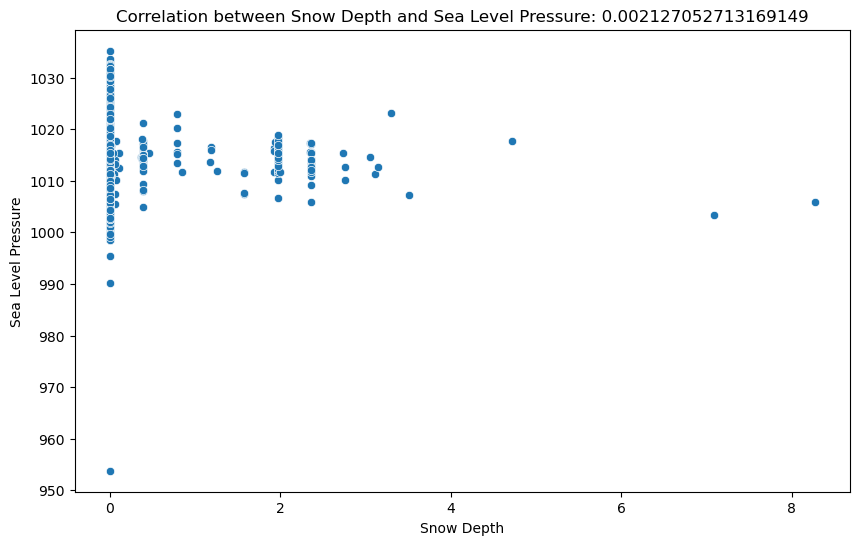

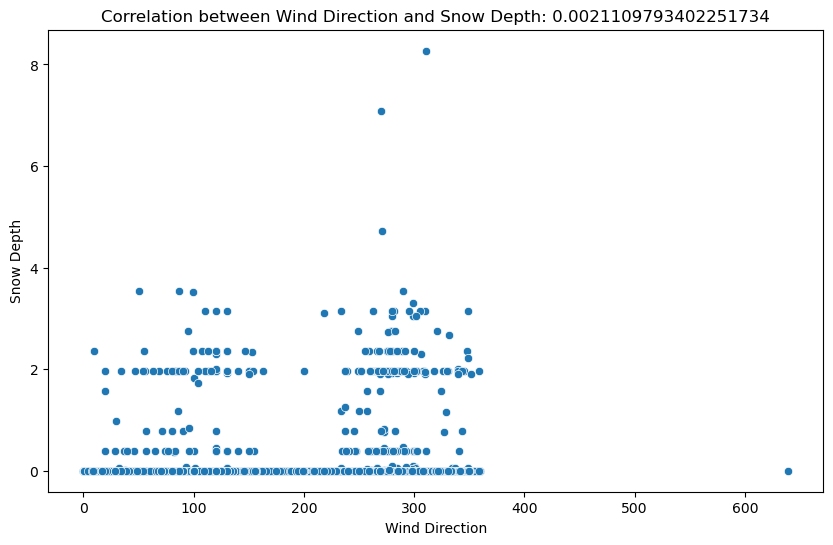

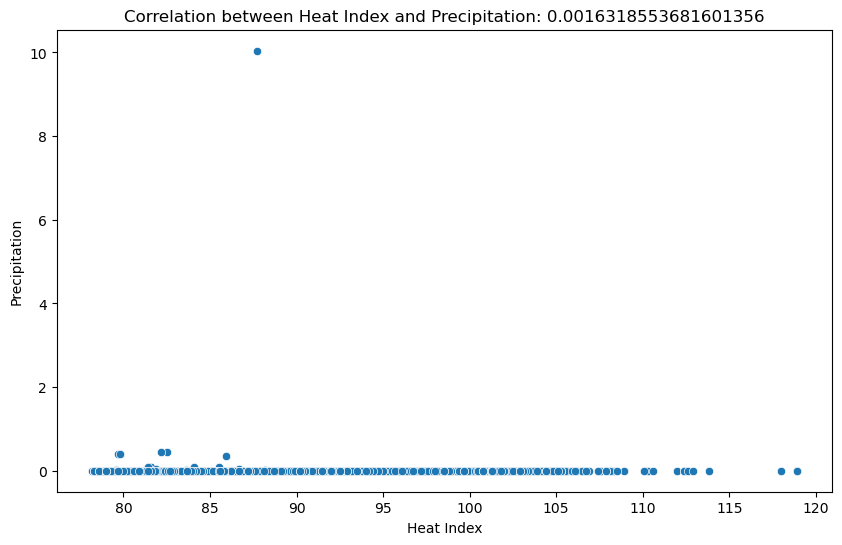

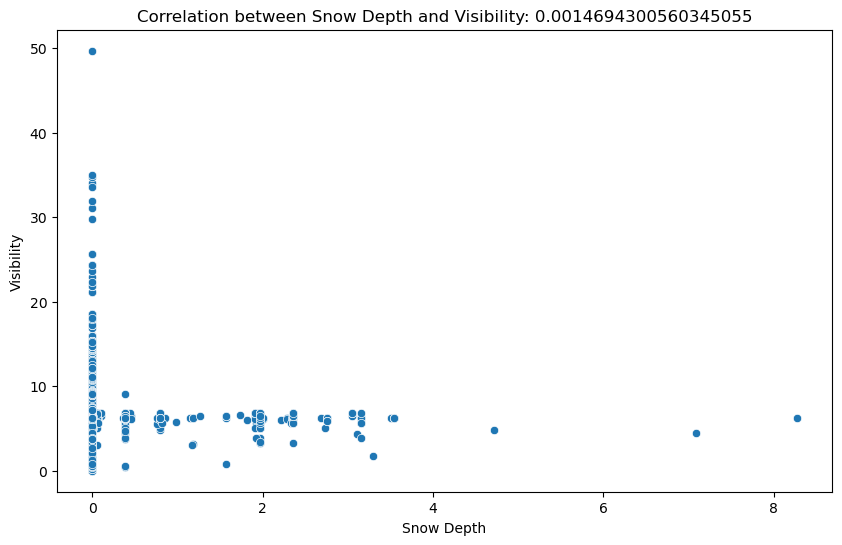

In [ ]:
plot_variable_correlations(df)

In [ ]:
# Create a new column for the year
df['Year'] = df['Date time'].dt.year

# Pivot the data to create a heatmap of temperature by month and year
df_pivot = df.pivot_table(index='Month', columns='Year', values='temp_c')

# Plot the heatmap
fig, ax = plt.subplots(figsize=(10,6))
im = ax.imshow(df_pivot, cmap='coolwarm')
ax.set_xticks(range(len(df_pivot.columns)))
ax.set_xticklabels(df_pivot.columns, rotation = 'vertical')
ax.set_yticks(range(len(df_pivot.index)))
ax.set_yticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
ax.set_xlabel('Year')
ax.set_ylabel('Month')
ax.set_title('Temperature by Month and Year')
fig.colorbar(im)
plt.show()



An Overview of tempature in Jerusalem for the entire period. An intersting conclusion can be seen with an increase in tempature (highlighted red sectiion) and decrease in cold tempature (highlighted blue sections.

In [ ]:
# Filter the dataframe for years after 2010
df_recent = df[df['Year'] > 2000]

# Pivot the data to create a heatmap of temperature by month and year
df_pivot = df_recent.pivot_table(index='Month', columns='Year', values='Temperature')

# Plot the heatmap
fig, ax = plt.subplots(figsize=(10,6))
im = ax.imshow(df_pivot, cmap='coolwarm')
ax.set_xticks(range(len(df_pivot.columns)))
ax.set_xticklabels(df_pivot.columns, rotation = 'vertical')
ax.set_yticks(range(len(df_pivot.index)))
ax.set_yticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
ax.set_xlabel('Year')
ax.set_ylabel('Month')
ax.set_title('Temperature by Month and Year (2011-2023)')
fig.colorbar(im)
plt.show()


Focusing on the last 20 years, we can see a clear indication of the abovemnetioned trend.

In [ ]:
import matplotlib.pyplot as plt

# Plot the distribution of temperatures
plt.hist(df['temp_c'], bins=50)
plt.xlabel('Temperature (°C)')
plt.ylabel('Frequency')
plt.title('Distribution of Temperatures')
plt.show()


Continuing the above analsys for tempature distribtuion, when dividing into 50 bins we can see clearly a normall distribution of frequency around the mentioned average. 

Calculating features for possible analysis and forecasting model

Create lagged variables of the temperature and other relevant variables (such as precipitation, wind speed, etc.) to see how past values of these variables are related to current temperature values

In [ ]:
df

Moving averages: Calculate moving averages of the temperature and other relevant variables over different time periods - here 7 days, to see how the values change over time. 

In [ ]:
# Calculate 7-day rolling average for temperature
df['temp_7d_rolling'] = df['temp_c'].rolling(window=7*24).mean()

# Plot the original temperature values and the 7-day rolling averages
plt.figure(figsize=(10,6))
plt.plot(df['Date time'], df['temp_c'], label='Temperature')
plt.plot(df['Date time'], df['temp_7d_rolling'], label='7-day Rolling Avg Temperature')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.title('Temperature and 7-day Rolling Average')
plt.legend()
plt.show()

# Save the updated DataFrame to a new CSV file
df.to_csv('hisotryWithRollingAverages.csv', index=False)


We have gap of averages prior of ~1995. However we can see the 7 days averages trend. Towards 2020 averages also were increased as indication for global warming. The std. deviation also increases as we can see in latest year from the spread of tempature suggesting the affects of extreme shifting in tempature.

In [ ]:
df.columns

In [ ]:
# Group the data by year and calculate the mean of the 'temp_7d_rolling' column for each year
yearly_temps = df.groupby(df['Date time'].dt.year)['temp_7d_rolling'].mean()

# Create a line plot of the annual average temperatures against the year
sns.lineplot(data=yearly_temps, x=yearly_temps.index, y=yearly_temps.values)

# Add a trendline to the plot
sns.regplot(data=yearly_temps, x=yearly_temps.index, y=yearly_temps.values)

# Set the plot title and axes labels
plt.title('Annual Average Temperature Trendline')
plt.xlabel('Year')
plt.ylabel('Temperature (C)')

# Show the plot
plt.show()

A final summary of tempature trend including the 7days priod averges trend. overall tempature increased over the year (orange trend line) from ~17°C to almost ~20°C (with a total average for period of 18°C). There were few spike from the average tempatures, however since year ~2000 averages got closer to the trend line.

In [ ]:
# Create a pairplot to visualize the correlation between Temperature and the temp_7d_rolling
sns.pairplot(df[['temp_c','temp_7d_rolling']])

Here we can see correlation and distribution from the observation's tempature to prior 7 days average tempature, suggesting there is a clear correlation and averages also disributed approxamitly normally. 